# Risk and Return - Efficient Frontier

This notebook aims to explore the problem of constructing an investment portfolio from a set of tickers, seeking an optimal balance between risk and returns. The goal is to identify portfolios on the Efficient Frontier, a corollary of Markowitz's Mean-Variance Theory (1952). Although the code uses example cases, it is designed for a comprehensive and customizable analysis based on the available data or any additional data that one wishes to include.

We begin by importing all the libraries we will use.

In [25]:
#!pip install PyPortfolioOpt
#!pip install plotly

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import yfinance as yf
import copy
import plotly.express as px
import plotly.graph_objects as go
from pypfopt import EfficientFrontier # https://pyportfolioopt.readthedocs.io/en/latest/GeneralEfficientFrontier.html
from pypfopt import EfficientSemivariance
from pypfopt import risk_models # https://pyportfolioopt.readthedocs.io/en/latest/RiskModels.html
from pypfopt import expected_returns as expret # https://pyportfolioopt.readthedocs.io/en/latest/ExpectedReturns.html
from pypfopt import plotting
from scipy.optimize import Bounds
from scipy.optimize import LinearConstraint
from scipy.optimize import minimize #https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html

script_dir = 'C:\\Users\\ftrup\\Documents\\GitHub\\QuantitativeTrading\\'
os.chdir(script_dir)

pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

## Obtaining the Data  
We define the frequency of the price data that we will use in this analysis. Creating this variable will help generalize several algorithms and calculations in the script. In our example case, we will work with daily data. We also obtain the "risk-free rate," which usually corresponds to the interest rate on 10-year U.S. Treasury bonds.

In [26]:
freq = "1d" # "1m", "15m", 1h", "1wk", "1mo", etc
if freq == "1d":
    ipy = 252 # intervals per year
elif freq == "1wk":
    ipy = 50.4
elif freq == "1mo":
    ipy = 12

def get_risk_free_rate():
    """ It retrieves the risk-free rate from the 10-year bond (US10Y). """
    try:
        bond = yf.Ticker("^TNX")  # 10-year bond yield
        return bond.info.get("regularMarketPrice", 4) / 100  # Decimal convertion
    except:
        print(f'No data was retrieved for the risk-free rate from the ^TNX bond, using the default value of 0.04.')
        return 0.04  # Default si falla
rfr = get_risk_free_rate()

**If the data is already saved in a .pkl file:**  
Access the folder where the file is saved and specify the file name. The dataframes containing the historical price data of a group of tickers (`df`) and the dataframe with information about the returns and volatility of the tickers (risk and return or `rar`) are loaded. In this example, `df` contains the daily prices of the S&P500 since 2015.  
  
**If the data is not already saved:**  
First, run `financial_instruments`, and then use the `data_fetcher` to obtain the historical price data in the dataframe called `df`. After that, we calculate the returns, volatility, and Sharpe ratio. Optionally, we can also retrieve the market cap and sector data. The data is obtained and saved in the `rar` dataframe.

In [3]:
sys.path.append(os.path.abspath("modules"))

from modules.financial_instruments import fetch_tickers
from modules.data_fetcher import YahooDataFetcher

script_dir = 'C:\\Users\\ftrup\\Documents\\GitHub\\QuantitativeTrading\\' # FOLDER DIRECTION
os.chdir(script_dir)

# Verify if the allstocks_dataYfinance.pkl file already exists:
data_file = os.path.join(script_dir, 'data', 'allstocks_dataYfinance.pkl')
rar_file = os.path.join(script_dir, 'data', 'allstocks_rar.pkl')

if os.path.exists(data_file):
    df = pd.read_pickle(data_file)
else:
    print("The prices data file does not exist. Fetching the data.")
    ticker = "S&P 500"
    archivo = "links_indices.json"
    fetcher = fetch_tickers(ticker, archivo)
    ticker_list = fetcher.fetch_indices()
    # You may include any list of aditional tickers here:
    ticker_list = ticker_list + ["BABA", "MELI", "YPF", "VIST", "GGAL", "PAM", "BMA", "SUPV", "QBTS", "IONQ", "RGTI"]
    
    symbol = tickers_list
    timeframe = freq
    start_date = "2015-01-01"
    end_date = "2025-03-09"
    name = 'allstocks'
    fetcher = YahooDataFetcher(tickers=symbol, interval=timeframe, start_date=start_date, end_date=end_date, name = name)
    fetcher.fetch_data()
    df = fetcher.load_data()

    #Save dataframe
    df.to_pickle(script_dir+'\\data\\allstocks_dataYfinance.pkl')  

# Verify if the allstocks_rar.pkl file already exists:
if os.path.exists(rar_file):
    rar = pd.read_pickle(rar_file)
else:
    print("The risk and return data file does not exist. Fetching the data.")
    prices = df["Close"]
    tickers = prices.columns
    daily_returns = prices.pct_change(fill_method=None)
    daily_neg_returns = daily_returns[daily_returns < 0]
    daily_volatility = daily_returns.std(axis=0)
    daily_neg_volatility = daily_neg_returns.std(axis=0)
    
    n = int(np.round(daily_returns.shape[0] / ipy)) 
    
    columns=['annual_return,'CAGR', 'annual_volatility', annual_neg_volatility']
   
    rfr = get_risk_free_rate()
    
    rar = pd.DataFrame(index=tickers, columns=columns) #data frame risk-and-return
    
    for ticker in tickers:   
        rar.loc[ticker] = [(1 + np.mean(daily_returns[ticker]))**ipy - 1, # annual returns
                           ((prices[ticker].iloc[-1]/prices[ticker].iloc[-n*ipy])** (1/n) - 1), # with the n year difference
                           daily_returns.std(axis=0).loc[ticker] * np.sqrt(ipy), # annual volatility
                           daily_neg_returns.std(axis=0).loc[ticker] * np.sqrt(ipy)] # annual negative volatilidad
                           
    rar['sharpe_ratio'] = (rar['annual_return'] - rfr)/rar['annual_volatility']
    rar['sharpe_ratio_cagr'] = (rar['CAGR'] - rfr)/rar['annual_volatility']
    rar['sortino'] = (rar['annual_return'] - rfr)/rar['annual_neg_volatility']
    
    #Optional: get marketcap and sector of every ticker (may take a while):
    rar['market_cap'] = np.zeros(rar.shape[0])
    rar['sector'] = ""
    for ticker in tickers:
        stock = yf.Ticker(ticker)
        #stock.info.get("trailingPE")
        rar.loc[ticker, 'market_cap'] = stock.info.get("marketCap") # capitalización de mercado
        rar.loc[ticker, 'sector'] = stock.info.get("sector", " ") # sector de la industria

    #Save dataframe
    rar.to_pickle(script_dir+'\\data\\allstocks_rar.pkl')  

### Optional: Reduce the number of tickers based on a condition  
For example: Sharpe ratio, Sortino ratio, minimum volatility, maximum returns, market cap, etc.

In [28]:
prices = df["Close"]
tickers = prices.columns
# Sorting the tickers to select 100. You could order by another metric.
sorted_sharpe_rar = rar.sort_values(by=['sharpe_ratio_cagr'], axis=0, ascending=False)
sorted_min_variance_rar = rar.sort_values(by=['annual_volatility'], axis=0, ascending=True)
sorted_sortino_rar = rar.sort_values(by=['sortino'], axis=0, ascending=False)
sorted_market_cap_rar = rar.sort_values(by=['market_cap'], axis=0, ascending=False)

You can observe the position of a stock by checking its rank or position in the sorted list based on the selected metric. For example, after sorting the tickers by a chosen metric (e.g., Sharpe ratio, returns), you can identify the position of a specific stock in that ordered list.

In [5]:
#sorted_sharpe_rar.index.get_loc("AAPL")

Now we can make a reduced selection of `n` stocks. I’ll list two options here, and later define the chosen one with the name `select`.

In [29]:
n_tickers = 30
sharpe_select = sorted_sharpe_rar[:n_tickers]
minvolatility_select = sorted_min_variance_rar[:n_tickers]

select = sharpe_select

## Characterize the selected tickers
Once we've selected the tickers, we can analyze their characteristics such as:

- **Sector**: Identify the industry or sector the company belongs to.
- **Price history**: Review the historical price data for trends.
- **Price correlation**: Calculate the correlation between the prices of the different stocks.
- **Returns**: Calculate the return on investment (ROI) over a defined period.
- **Volatility**: Measure the price fluctuations to assess risk.
- **Sharpe ratio**: Evaluate risk-adjusted returns.
- **Market cap**: Assess the size and value of the company.

These metrics can provide a comprehensive view of each ticker’s performance and risk profile.


### Sectors

We will see the sector of each selected stock and group them in a bar graph to visualize the sector diversity of the selection. In our example, we can observe a diverse group, with a majority in technology, industrial, and financial sectors.

Ticker
NVDA                Technology
PGR         Financial Services
LLY                 Healthcare
CTAS               Industrials
FICO                Technology
RSG                Industrials
AJG         Financial Services
CPRT               Industrials
BRO         Financial Services
COST        Consumer Defensive
TPL                     Energy
MSFT                Technology
AVGO                Technology
LRCX                Technology
CDNS                Technology
MSCI        Financial Services
TMUS    Communication Services
MSI                 Technology
SNPS                Technology
WM                 Industrials
TT                 Industrials
ANET                Technology
AXON               Industrials
AAPL                Technology
AMZN         Consumer Cyclical
FTNT                Technology
ISRG                Healthcare
KLAC                Technology
MMC         Financial Services
AMD                 Technology
Name: sector, dtype: object

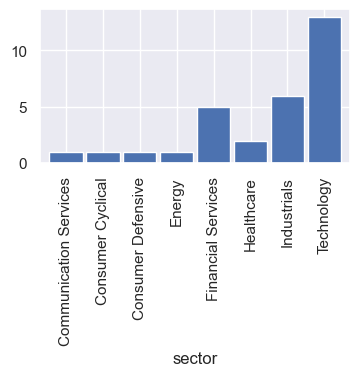

In [30]:
sector_group = select.groupby('sector')
fig, ax = plt.subplots(1, 1, figsize=(4,2))
sector_group.size().plot(kind='bar', ax=ax, width=0.9)
select['sector']

### Price history

The evolution of the historical prices is shown, normalized to an initial value of 1 USD, so you can see how many times the asset's value has multiplied.

In [31]:
ticker_selection = select.index   
stock_prices = prices[ticker_selection]

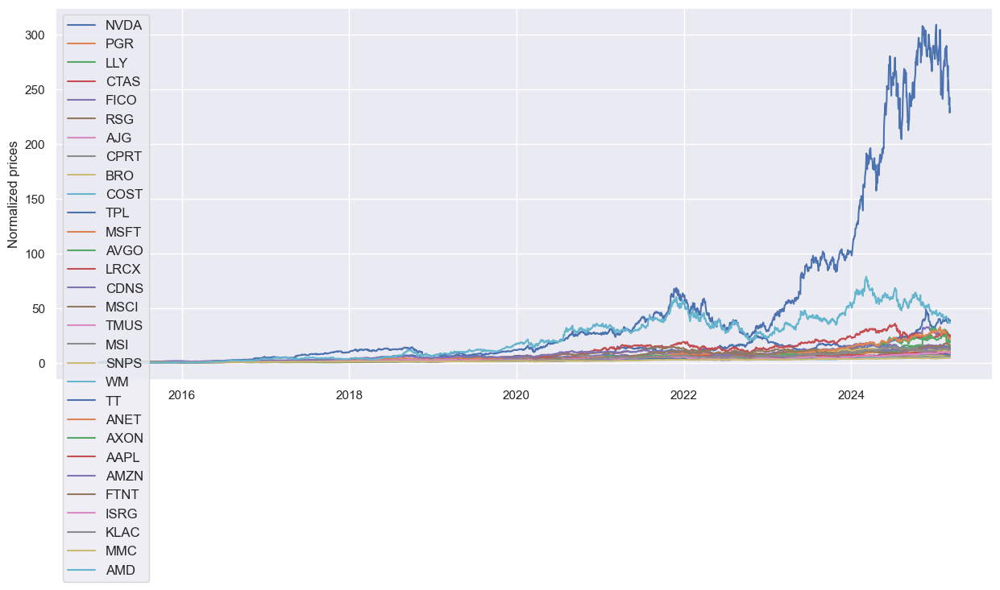

In [32]:
plt.figure(figsize=(15, 6))
for i in range(stock_prices.shape[1]):
    plt.plot(stock_prices.divide(stock_prices.iloc[0] / 1).iloc[:,i], label=stock_prices.columns.values[i])
plt.legend(loc='upper left', fontsize=12)
plt.ylabel('Normalized prices')
plt.show()

### Correlation between Prices  
This function calculates and plots the correlation between pairs of stocks in the portfolio. You need to input the dataframe with the stock prices.

In [34]:
def plot_correlation_matrix(stock_prices):
    corr_matrix = stock_prices.corr()   
    sns.set(font_scale=1)
    fig, ax = plt.subplots(figsize=(20,20)) 
    ax = sns.heatmap(corr_matrix, vmin=-1, vmax=1, center=0, 
                     cmap=sns.diverging_palette(20, 220, n=200), square= True, annot = True, 
                     cbar_kws= dict(use_gridspec=False,location="top",shrink= .5))#{ "orientation": "horizontal", "use_gridspec":"False", "shrink": .65})
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=15)#, horizontalalignment='right'); #rotation=45
    ax.set_yticklabels(ax.get_xticklabels(), fontsize=15, rotation=0, horizontalalignment='right'); 
    #plt.tight_layout()
    #https://gist.github.com/drazenz/c078e4dab8ade8b64e7dcf37cecd6640
    #https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec
    plt.show()

In [33]:
def plot_correlation_values(stock_prices):
    """
    It generates a graph of the correlation values for all the stocks in the dataset.
    """
    correlation_matrix = stock_prices.corr()
    correlations = []
    ticker_pairs = []
    
    for i, ticker1 in enumerate(stock_prices.columns):
        for j, ticker2 in enumerate(stock_prices.columns):
            if i < j:
                correlations.append(correlation_matrix.loc[ticker1, ticker2])
                ticker_pairs.append(f"{ticker1}-{ticker2}")
    
    sorted_indices = np.argsort(correlations)
    sorted_correlations = np.array(correlations)[sorted_indices]
    sorted_ticker_pairs = np.array(ticker_pairs)[sorted_indices]
    
    plt.figure(figsize=(18, 6))
    plt.scatter(range(len(sorted_correlations)), sorted_correlations, alpha=0.5)

    if len(stock_prices.columns) < 25:
        for i, txt in enumerate(sorted_ticker_pairs):
            if i % 2 == 0:
                plt.annotate(txt, (i, sorted_correlations[i]), fontsize=6, rotation=70, ha='center', va='bottom', xytext=(0, 10), textcoords='offset points')
            else:
                plt.annotate(txt, (i, sorted_correlations[i]), fontsize=6, rotation=70, ha='center', va='top', xytext=(0, -10), textcoords='offset points')
        
    plt.xlabel("Order index")
    plt.ylabel("Pearson Coefficient")
    plt.title("Correlation values between pairs of stocks.")
    plt.show()

We instantiate them with the list of selected tickers in the `stock_prices` dataframe. The following cell makes sense to run for a reduced number of stocks (due to the visualization of the matrix). And as can be seen, in our example, the stock prices are highly correlated.

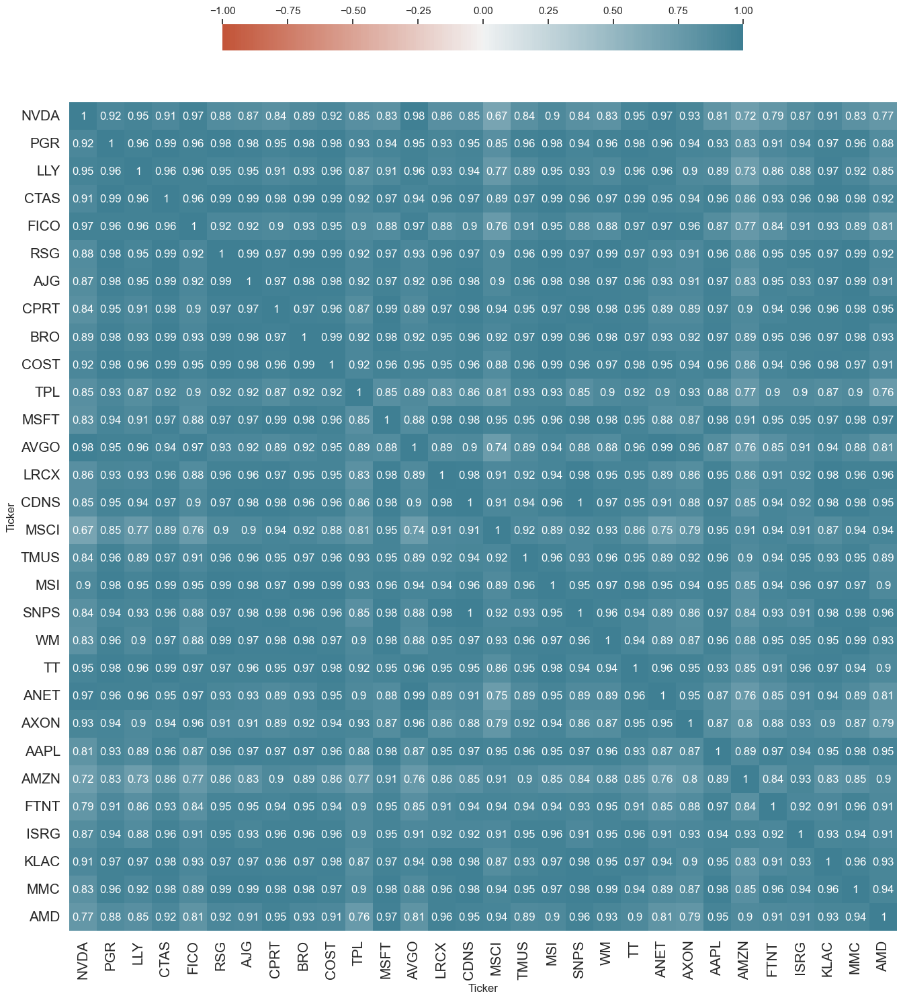

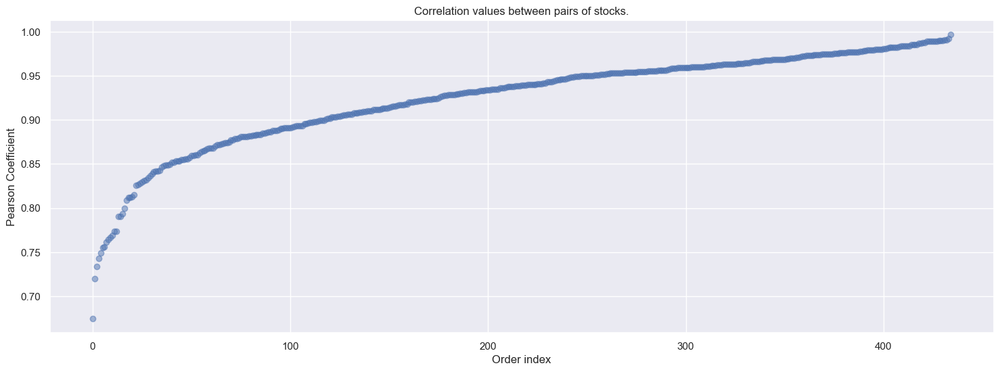

In [35]:
plot_correlation_matrix(stock_prices)
plot_correlation_values(stock_prices)

### Returns, Volatility, and Sharpe

#### Returns  
The topic of how to determine the expected return is worth paying close attention to, as there are different ways to calculate it. To start, the most common approach is to calculate the percentage changes in prices on a day-to-day basis. This way, we get a matrix of the same size as the price matrix (minus the first row, as it has no percentage change since it's the first). Then, we typically aim to determine the annual return. This is where different sources diverge in their calculation methods.
**How to calculate the annual expected return?**  
It is common to see the direct calculation based on the initial and final prices: $r = (\frac{p_f}{p_i} - 1)^{1/n}$ where $n$ is the number of years between the initial and final prices. This formula does not generate an appropiate estimator but the actual total return of the investment in the timeframe considered, and the $1/n$ power accounts for the fact that the returns where generated in $n$ years and the returns have compound effect.  
Another usual calculation is: $r = (1 + \bar{r}) \cdot 252 - 1$, where $\bar{r} = \frac{1}{N} \sum_i r_i$ is the average daily return, $r_i$ is the return on day $i$, and $N$ is the total number of periods in the dataframe. However, this method does not take into account that returns generate a compounded price increase.  
Two more accurate ways are: $r = (1 + \bar{r})^{252} - 1$ or $r = \big[ \prod_i (1 + r_i) \big]^{252/N} -1$. It's important to highlight that although the first two formulas are simplifications and do not formally correspond to derivations from underlying mathematical models, the last two do come from stochastic models for price evolution. The choice between them depends on the analyst's decision. In this study, the third method is chosen.  
Naturally, the different methods of calculating returns yield different values, and therefore, to estimate an investment's return and compare it with other investments, it's important to consider how it's being calculated and be consistent with how the comparison values were computed.  
**What time window should be used to view the prices? Should more recent data be given more importance?**  
There are many different approaches found online, ranging from considering historical data since the company’s founding to considering just the past year, with equal weighting or assigning more weight to recent data, such as in the case of an exponential moving average. In this study, we initially apply the model to a 10-year time window, but we also evaluate the stability of metrics depending on which time window is used.

#### Volatility  
The volatility of a single stock is calculated as the standard deviation of the daily returns. To obtain the annualized volatility, we simply multiply by $\sqrt{252}$. In the case of a stock portfolio, the covariance matrix needs to be considered (the matrix calculation is shown in a later section).

#### Sharpe Ratio  
The Sharpe ratio is calculated as: $s = \frac{r - r_f}{\sigma}$, where $r_f$ is the risk-free return, often associated with the return on 10-year US Treasury bonds. In general, the Sharpe ratio is a metric that provides information about returns adjusted for risk. The higher the Sharpe ratio, the better the asset’s return relative to its volatility. Depending on how returns are calculated and how the risk-free rate is determined, different values for the Sharpe ratio will be obtained. However, it is a metric of interest for comparison with coefficients calculated in the same way. 

Since our goal is to find a portfolio with a high Sharpe ratio and/or low volatility that performs "well" over time, meaning it allows us to estimate future returns, it's important to see how these metrics change over time.  

In this first instance, we will calculate and plot the annualized return, volatility, and Sharpe ratio of individual tickers over different time windows. We will analyze both the values and the correlation they have with the return/volatility/Sharpe of the following year or years.  

The code will have the following parameters:  
**i.** The number of years `y1` going back from when we start taking data: `.iloc[-n*ipy]` (remember that `ipy` is intervals per year = 252)  
**ii.** The number of years `g` in which we will group the data to take its metrics and compare them with the metrics of the following `g` years.  
**iii.** The number of years `y2` we want to estimate for the future, which will determine how far back we stop taking data.  
This way, we can get an intuition of which amount of years is best to use as historical data to predict the following `n`. While the results will likely depend on the stock and the period studied, it would be interesting to explore if any conclusive insights can be drawn.

In [36]:
daily_returns = stock_prices.pct_change(fill_method=None).iloc[1:len(prices.index),:] # creates a new DataFrame with daily returns (removing the first row of NaNs).
daily_volatility = daily_returns.std(axis=0)
r = (1 + np.mean(daily_returns,axis=0))**ipy-1 # calculates the annualized average return for each stock.  
covar = daily_returns.cov()*ipy # creates a covariance matrix of stock price variations.


# Another way to calculate it with the pypfopt library:
# mu = expected_returns.mean_historical_return(stock_prices) # https://pyportfolioopt.readthedocs.io/en/latest/ExpectedReturns.html
# This actually calculates a return using the following formula:
# r2 = (1 + daily_returns).prod() ** (ipy / daily_returns.count()) - 1 
#covar = risk_models.sample_cov(stock_prices) # https://pyportfolioopt.readthedocs.io/en/latest/RiskModels.html

Next, we plot the daily returns for all stocks, both over time and as a probability density. As expected, daily stock returns follow a bell-shaped Gaussian distribution centered around zero (usually slightly skewed toward the positive side), with varying standard deviations depending on the stock. The third chart shows the performance of each ticker, with NVDA as the clear winner in terms of returns achieved.

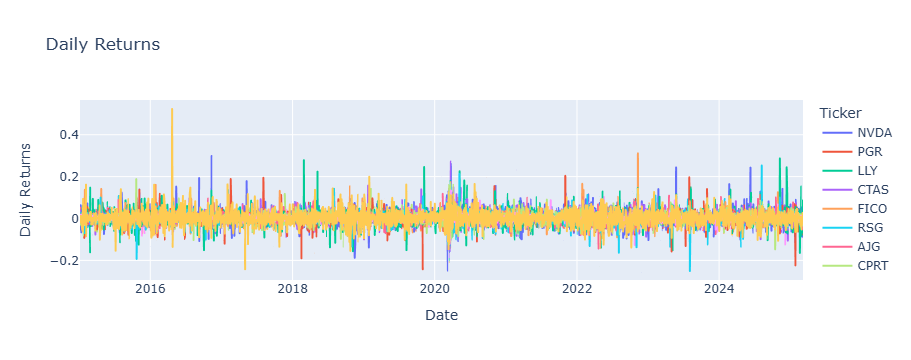

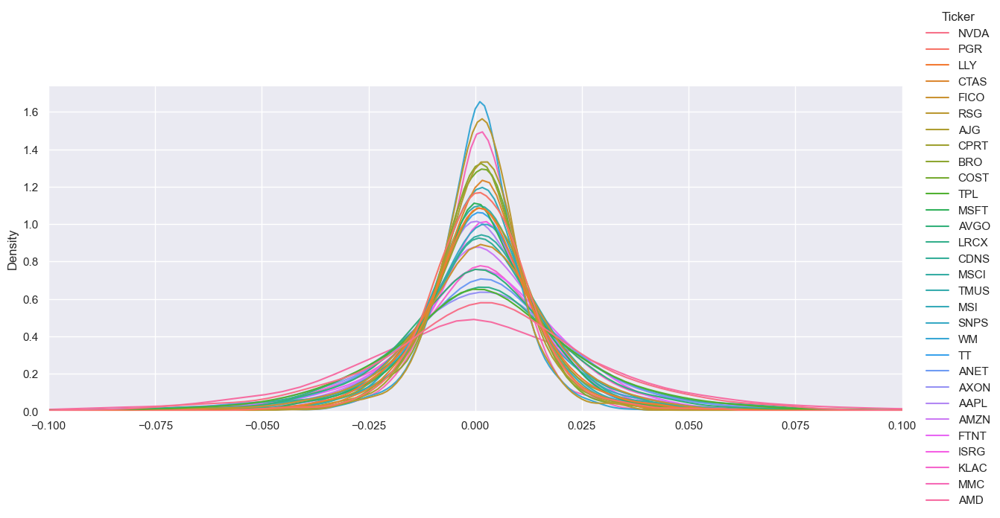

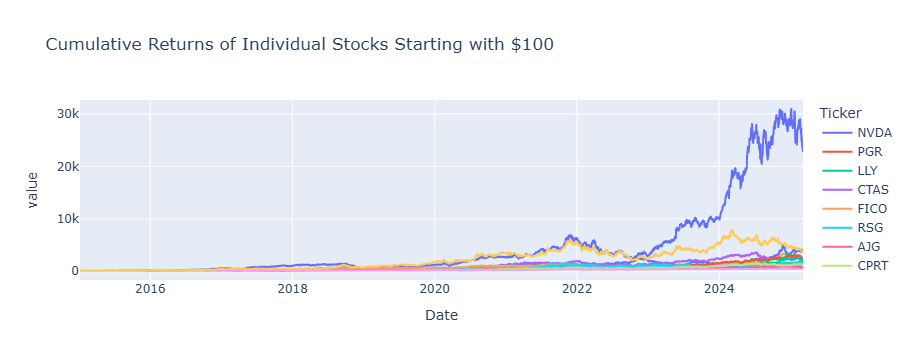

In [37]:
fig = px.line(daily_returns, title='Daily Returns').update_layout(xaxis_title="Date", yaxis_title='Daily Returns')
fig.show()
sns.displot(data=daily_returns, kind = 'kde', aspect = 2.5)
plt.xlim(-0.1, 0.1)
plt.show()

def plot_cum_returns(data, title):    
    daily_cum_returns = (1 + daily_returns).cumprod()*100
    fig = px.line(daily_cum_returns, title=title)
    return fig
    
fig_cum_returns = plot_cum_returns(daily_returns, 'Cumulative Returns of Individual Stocks Starting with $100')
fig_cum_returns.show()

### Metrics Based on Time Intervals  

The following function calculates annual returns, annual volatility, and the Sharpe ratio (**R**eturn **S**tandard **D**eviation **S**harpe).  

It takes as input a dataframe with daily returns and two parameters `(y1, y2)` that define the time window in years. The first value (`y1`) specifies how many years back the calculation starts, while the second (`y2`) determines up to which year the data is considered (also counted as years back from today). The function returns three dataframes, each containing the annual return, volatility, and Sharpe ratio for each ticker in the rows and their respective values in the columns. The covariance matrix is returned as a fourth dataframe.  

It is important to note that the function calculates based on rolling years in terms of days, not calendar years. For example, if we are in March 2025 and the parameters are `y1=1, y2=0`, the function will use data from the last 252 periods up to today, i.e. from March 2024.

In [38]:
def rsds(daily_returns, y1 = len(daily_returns)/252, y2 = None, ipy = 252, rfr = 0.04): 
    """
    Computes the Annual Returns of Each Stock Based on the Composition of Daily Returns
    args():
    daily_returns (pd.DataFrame) : Dataframe containing daily returns.
    y1 (scalar)                  : Starting point for the calculation, defined as the number of years back from today: `y1 = current year - start year`.
    y2 (scalar)                  : End point for the calculation, defined as the number of years back from today: `y2 = current year - end year`. 
    ipy (scalar)                 : Intervals per year, representing the frequency of price data.
    returns:
    r (pd.DataFrame)             : Annual returns for each ticker.
    sd (pd.DataFrame)            : Annual volatility for each ticker.  
    s (pd.DataFrame)             : Sharpe ratio for each ticker.  
    covar (pd.DataFrame)         : Covariance matrix of returns among tickers.   
    """
    if y1*ipy > len(daily_returns) or y1 <= y2 or y1 < 0 or y2 < 0:
        print("Error: the parameters (y1, y2) were entered incorrectly")
        return
    else:
        start_idx = int(-y1 * ipy)
        if y2 == None:
            end_idx = y2
        elif y2 == 0:
            end_idx = None
        else:
            end_idx = -y2*ipy
        r = (1 + np.mean(daily_returns.iloc[start_idx:end_idx],axis=0))**ipy - 1 
        sd = daily_returns.iloc[start_idx:end_idx].std(axis=0)*np.sqrt(ipy)
        covar = daily_returns.iloc[start_idx:end_idx].cov()*ipy
        s = (r-rfr)/sd 
        return r, sd, s, covar

The following function groups the data based on the years available. It calculates returns, volatility, and Sharpe from a segment of the historical data, and allows for comparison of how these parameters change based on the observed segment. The columns, as a reference, are named after the year in which the initial and final data points fall, without specifying the exact starting date (as it depends on the final date of the dataframe's data).

In [39]:
def rsds_for_interval(daily_returns, N = 10, interval = 1, n = 0, ipy = 252, rfr=0.04): 
    """
    args():
    daily_returns (pd.DataFrame): Dataframe containing daily returns.
    N (scalar)                  : Starting point for the analysis, defined as the number of years back from today.
    interval (scalar)           : Grouped year interval for calculations.
    n (scalar)                  : Up to which year the calculation is made (taken as years backwards from today).
    ipy (scalar)                : Intervals per year (the frequency of the price data).
    """
    r_for_interval = pd.DataFrame()
    sd_for_interval = pd.DataFrame()
    s_for_interval = pd.DataFrame()
    y0 = (N - n) % interval # this calculates the remainder of this division to determine in which year to start considering the data.
    for i in np.arange(y0,N-n,interval): # this ensures that the correct data groups are selected.
        y1 = N-i
        y2 = N-i-interval-n
        if y2 == 0:
            end_idx = -1
        else:
            end_idx = -y2*ipy
        column = "{}-{}".format(daily_returns.index.year[-y1*ipy], daily_returns.index.year[end_idx])
        r_for_interval[column], sd_for_interval[column], s_for_interval[column], covar = rsds(daily_returns, y1=y1, y2=y2, ipy=ipy, rfr=rfr)

    if interval == 1:
        fig1 = px.line(r_for_interval.T, title="For each year").update_layout(xaxis_title="Date", yaxis_title="Returns")
        fig1.show()
    else:   
        fig1 = px.line(r_for_interval.T, title="Grouped by {} years".format(interval)).update_layout(xaxis_title="Date", yaxis_title="Returns")
        fig1.show()
    fig2 = px.line(sd_for_interval.T).update_layout(xaxis_title="Date", yaxis_title='Volatility')
    fig2.show()
    fig3 = px.line(s_for_interval.T).update_layout(xaxis_title="Date", yaxis_title='Sharpe')
    fig3.show()
    return r_for_interval, sd_for_interval, s_for_interval

In the following line, we can instantiate the function `rsds_for_interval()`. The only things we need to change are the number `N` of years we want to look back, the number of years in the interval `interval` we want to group, and how many years back `n` we want to calculate.

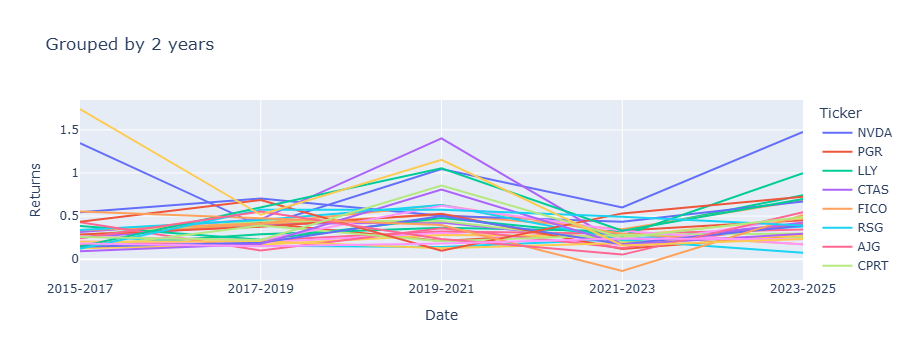

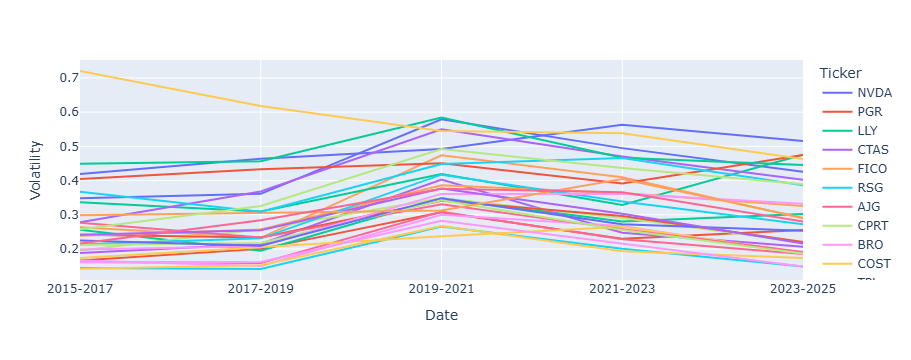

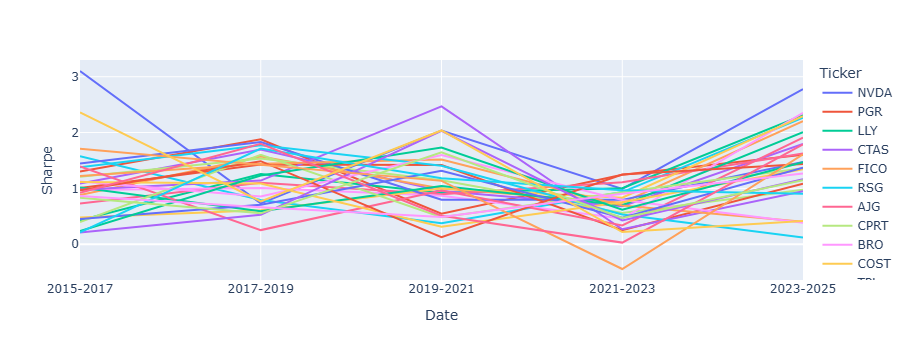

In [40]:
N = 10
interval = 2
n = 0
r_for_interval, sd_for_interval, s_for_interval = rsds_for_interval(daily_returns, N=N, interval=interval, n=n, rfr = rfr) 

As can be seen, it is only in groups of 3 consecutive years that we start to see greater regularity in the variables. This gives an idea of the importance of considering the investment time horizon based on the time interval used to estimate returns, and taking into account the associated risk in case our estimation considered a shorter interval than what can really be expected for reproducibility.   
  
However, more importantly, as it is common knowledge, past returns are not a guarantee of future returns in the stock market. To truly determine the effectiveness of using these metrics to generate an investment portfolio, in a later section, we will study the returns obtained by portfolios generated from previous information (backtesting) [_see section Evaluating the Method's Effectiveness in Portfolio Selection_].

### Correlation between Stock Returns  
The Pearson correlation coefficient is a normalized version of covariance: $\rho = \frac{Cov(X,Y)}{\sigma_X \sigma_Y}$  
Below we have the correlation matrix and a breakdown of the correlation coefficients for the returns of each stock pair. We can see that there are some pairs with a high correlation, such as **CDNS** (Cadence Design Systems) and **SNPS** (Synopsys), both in the software development sector within the technology industry. On the other hand, there are pairs with very low correlation, such as **LLY** (Eli Lilly and Company) from the pharmaceutical sector [Healthcare] and **TPL** (Texas Pacific Land Corp) from the Oil & Gas sector [Energy].

(Again, the following cell makes sense to run for a reduced number of stocks)

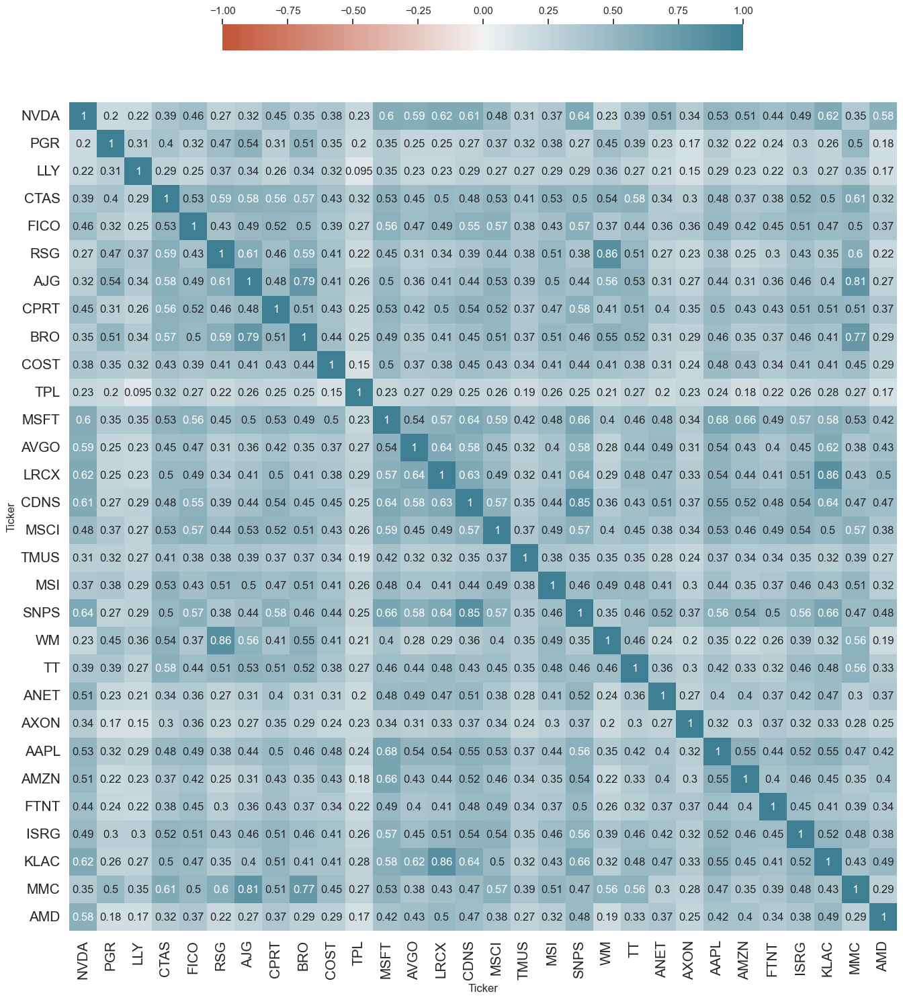

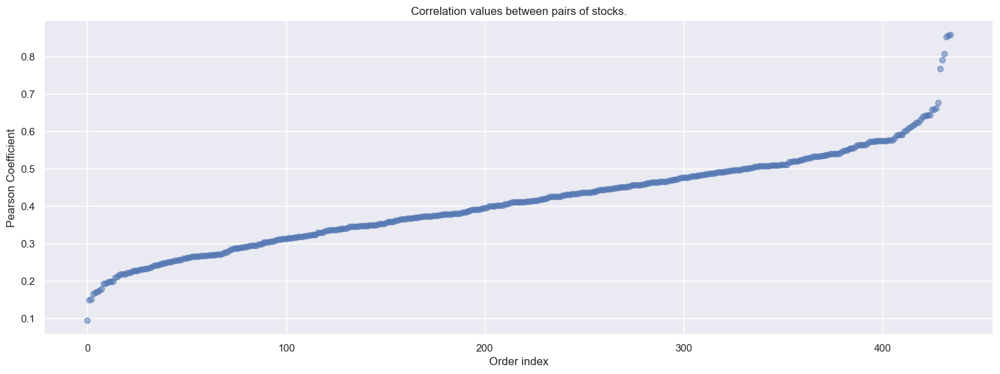

In [41]:
plot_correlation_matrix(daily_returns)
plot_correlation_values(daily_returns)

## Obtain portfolio on the efficient frontier
There is more than one possible criterion to obtain the portfolio. The efficient frontier represents a range of possible combinations of returns and volatility. Therefore, one could choose, for example, to minimize variance, maximize returns, or optimize the Sharpe ratio.

#### Minimum Risk Portfolio
To calculate the portfolio return, simply perform a dot product between the weights and the annualized return of each stock: $r \cdot w$  

To calculate the portfolio volatility, the following calculation is needed: $\sigma = \sqrt{w \cdot C \cdot w^T}$
Each off-diagonal element of the covariance matrix is multiplied by both weights, while the diagonal elements are multiplied by the weight of the asset twice. That’s why the square root is applied at the end. The porfolio volatility lies in the diagonal of the resulting matrix.   
  
Finally, to calculate the Sharpe ratio: $s = \frac{r - r_f}{\sigma}$
where $r_f$ is the risk-free rate, obtained from the 10-year US Treasury bond yield.
  
Let's start the code by defining some functions. These formulas apply when considering a single portfolio, meaning that `w` is a vector of weights, not a matrix.

In [42]:
# Rate of return
def ret(r,w): # r: annual returns, w: weight of the stock in the portfolio.
    return r.dot(w)
# Volatility
def vol(covar,w):
    return np.sqrt(np.dot(w,np.dot(covar,w.T)))
# Sharpe
def sharpe(ret,vol,rfr):
    return (ret-rfr)/vol

In [43]:
bounds = Bounds(0, 1) # Límites de los pesos individualmente
linear_constraint = LinearConstraint(np.ones((daily_returns.shape[1],), dtype=int),1,1) # Limits of the set of weights
w0 = np.ones(daily_returns.shape[1])/np.sum(np.ones(daily_returns.shape[1])) # weights initialized as ones normalized by the number of assets.

In [44]:
# The line below calculates the volatility through the product between a vector w and the covariance. 
# In this case, since it has only one dimension, the order of the inner product doesn't matter. 
# But for the sake of formality, it's put it in the correct order with the transpose.
fun1 = lambda w: np.sqrt(np.dot(w,np.dot(covar,w0.T))) 

# The following line searches for the w's that minimize the portfolio variance, using the Trust-Region Constrained Algorithm method.
# see documention: https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html#:%7E:text=and%20lower%20bounds.-,Constrained%20Minimization,-Method%20COBYLA%20uses
res = minimize(fun1,w0, method='trust-constr', constraints = linear_constraint, bounds = bounds) # the two methods that work are 'SLSQP' and 'trust-constr'
w_min = res.x # weights of the stocks in the portfolio with the minimum variance.
portfolio_min_var = pd.DataFrame(w_min, index=r.index, columns=["Weights"])
print('return: % .2f'% (ret(r,w_min)), 'volatility: % .3f'% vol(covar, w_min))
portfolio_min_var.round(6)

return:  0.20 volatility:  0.191


,Weights
Ticker,
NVDA,0.000009
PGR,0.000504
LLY,0.000250
CTAS,0.000029
FICO,0.000016
RSG,0.001699
AJG,0.000065
CPRT,0.000028
BRO,0.000056


As can be observed, the obtained portfolio is practically an investment in the ticker WM (Waste Management, Inc.), so while it could be a safe investment with an annualized return of 20% and a volatility of 19%, it is not what we are looking for.

#### Maximum Sharpe Portfolio

In [45]:
# Since the function minimizes, we calculate the inverse of the Sharpe ratio: 1/s.
fun2 = lambda w: np.sqrt(np.dot(w,np.dot(covar,w.T)))/(r.dot(w)-rfr)
res_sharpe = minimize(fun2,w0,method='trust-constr',constraints = linear_constraint,bounds = bounds)
w_sharpe = res_sharpe.x # weights of the stocks that make up the portfolio with the maximum Sharpe ratio.
portfolio_max_sharpe = pd.DataFrame(w_sharpe, index=r.index, columns=["Weights"])
print('return: % .2f'% (ret(r,w_sharpe)), 'risk: % .3f'% vol(covar,w_sharpe), 'sharpe: % .2f'% sharpe(ret(r,w_sharpe),vol(covar,w_sharpe),rfr))
portfolio_max_sharpe.round(6)

return:  0.56 risk:  0.237 sharpe:  2.19


,Weights
Ticker,
NVDA,0.294973
PGR,0.274397
LLY,0.207495
CTAS,0.000003
FICO,0.000572
RSG,0.000008
AJG,0.000002
CPRT,0.000002
BRO,0.000001


### Another quick way to obtain the efficient frontier
There is a Python library called PyPortfolioOpt (`pypfopt`) that has classes developed to obtain these parameters (and more), and its implementation is fast and simple. I didn't use it until now because 1) its internal class for calculating returns uses a different model (as shown in "Return" subsection), and 2) in this analysis, I wanted to expose the underlying calculations of the model and the criteria used step by step to reach the result. However, below is the code to obtain the dataframe analogous to `portfolio_max_sharpe` with this library, where we can see that the result is the same (except that it already includes a way to round the weights with the `clean_weights()` command).

In [46]:
ef = EfficientFrontier(r, covar)
rfr = get_risk_free_rate()
ef.max_sharpe(risk_free_rate=rfr)
weights = ef.clean_weights()
weights_df = pd.DataFrame.from_dict(weights, orient = 'index')
weights_df.columns = ['Weights']
weights_df

,Weights
NVDA,0.29503
PGR,0.27444
LLY,0.20751
CTAS,0.00000
FICO,0.00043
RSG,0.00000
AJG,0.00000
CPRT,0.00000
BRO,0.00000
COST,0.00000


### Portfolio Reduction
In general, it may happen that if we initially include a high number of tickers, several of them may not be relevant in the portfolio on the efficient frontier. As can be seen in this case, only 6 out of 30 companies have significant participation. For this reason, and to simplify the operations, it may be preferable to eliminate from the portfolio those tickers with low participation. 

Moreover, since operations have transaction costs, there is always a minimum percentage of participation in a ticker in the portfolio for it to be justified. In such cases, it can be useful to eliminate stocks that have a weight below a certain threshold, or round up to that number if the weight is close to it.

Next, we will remove cases below a certain value `p_limit` and round values above that value to a minimum of `p_min`.

As an example, the case is implemented where, if the weight of a stock is $w_i$ < 0.5%, that stock will be removed from the portfolio, and its weight will be redistributed among the remaining stocks. If the weight falls between 0.5% and 1%, it will be rounded up to ensure at least 1% is invested in that stock. This may not be necessary for portfolios with high enough assets under management (AUM).

In [47]:
portfolio = portfolio_max_sharpe
p_limit = 0.005 #
p_min = 0.01 #

index_out = []
index_round = []
p_out = 0
p_round = 0
for i in range(len(portfolio)):
    if portfolio.iloc[i,0] < p_limit:
        p_out += portfolio.iloc[i,0]
        index_out.append(i)
    elif portfolio.iloc[i,0] < p_min and portfolio.iloc[i,0] >= p_limit:
        p_round += portfolio.iloc[i,0]
        index_round.append(i)
#print(p_round, index_round, p_out, index_out)
if index_round != []:
    portfolio = portfolio*0.99/(1-p_round)
    portfolio.iloc[index_round] = 0.01
if index_out != []:
    portfolio.drop(portfolio.index[index_out], inplace=True)
    portfolio = portfolio/(1-p_out)
 
print(np.sum(portfolio, axis = 0).round(3))
portfolio.round(3)

Weights    1.0
dtype: float64


,Weights
Ticker,
NVDA,0.295
PGR,0.275
LLY,0.208
TPL,0.167
TMUS,0.022
AXON,0.033


The following line does the same thing but in the case where the values are already rounded, as in the case of the efficient frontier calculated using the pypfopt library, which includes the `ef.clean_weights()` function. In this case, it is enough to remove the values equal to zero.

In [48]:
portfolio_2 = copy.deepcopy(weights_df[weights_df['Weights'] != 0])

Now we create new dataframes that only contain the history of the stocks in the portfolio. Also reducing the arrays of weights obtained earlier.

In [49]:
portfolio_stock_prices = copy.deepcopy(stock_prices.loc[:, portfolio.index])
portfolio_daily_returns = copy.deepcopy(daily_returns.loc[:, portfolio.index])
portfolio_r = copy.deepcopy(r.loc[portfolio.index])
portfolio_covar = portfolio_daily_returns.cov()*ipy 

To finish this section, let's look at the distribution of the sectors of the stocks in the portfolio. As expected, there is good diversification across sectors, which generally helps reduce the portfolio's volatility.

In [50]:
portfolio_sectors = rar.loc[portfolio.index, 'sector']
portfolio_sectors

Ticker
NVDA                Technology
PGR         Financial Services
LLY                 Healthcare
TPL                     Energy
TMUS    Communication Services
AXON               Industrials
Name: sector, dtype: object

### Plotting the Efficient Frontier
There is more than one way to plot it. For simplicity, we will use the PyPortfolioOpt (`pypfopt`) library, which has a function for automatic plotting. In this case study, we will plot both the frontier of the full original portfolio (30 tickers) and the frontier of the reduced portfolio (6 tickers). We will also create random portfolios of both types to complete the return vs. volatility graph.

In the code below, we will define some functions for plotting and then instantiate them.

To see a way to "manually" obtain and plot the efficient frontier, see https://www.kaggle.com/code/trangthvu/efficient-frontier-optimization.

In [51]:
def plot_random_portfolios(r, covar, n_samples = 1000):
    """
    Plots portfolios with random weights based on the return and covariance dataframes of a group of tickers.
    args()
    r (pd.Dataframe)     : contains the annual returns of the portfolio's stocks.
    covar (pd.Dataframe) : covariance matrix of the returns of the portfolio's stocks.
    n_samples (scalar)   : number of samples added to the graph
    """
    w = np.random.dirichlet(np.ones(len(r)), n_samples) # vectors where each element > 0, and the sum of all elements equals 1.
    rets = w.dot(r) # the same expected returns we introduced into the function, multiplied by their respective weights.
    stds = np.sqrt(np.diag(w @ covar @ w.T)) # the @ symbol calculates the dot product (it's another notation).
    # we keep only the diagonal elements of the resulting matrix, as we are not interested in the covariance terms between different portfolios.
    sharpes = (rets - rfr) / stds

    plt.scatter(stds, rets, marker=".", c=sharpes, cmap="viridis", zorder=1)
    plt.tight_layout()
    return 

def plot_max_sharpe_and_ef(r, covar, ax, rfr):
    """
    Plots the efficient frontier from the returns and covariance dataframes of a group of tickers.
    It also requires the plot axes and the risk-free rate (rfr) to be entered.
    args():
    r (pd.Dataframe)     : contains the annual returns of the portfolio's stocks.
    covar (pd.Dataframe) : covariance matrix of the portfolio's stock returns.
    ax                   : ax from plt.subplot()
    rfr (float)          : risk free rate
    """
    # Plot efficient frontiere
    ef = EfficientFrontier(r, covar) # https://pyportfolioopt.readthedocs.io/en/latest/GeneralEfficientFrontier.html
    ef_max_sharpe = copy.deepcopy(ef)
    plotting.plot_efficient_frontier(ef, ax=ax, show_assets=True)
    
    # Plot the portfolio with the maximum Sharpe ratio.
    ef_max_sharpe.max_sharpe(risk_free_rate=rfr)
    ret_tangent, std_tangent, _ = ef_max_sharpe.portfolio_performance(risk_free_rate = rfr)
    ax.scatter(std_tangent, ret_tangent, marker="*", s=100, c="r", label="Max Sharpe", zorder=3)
    return    

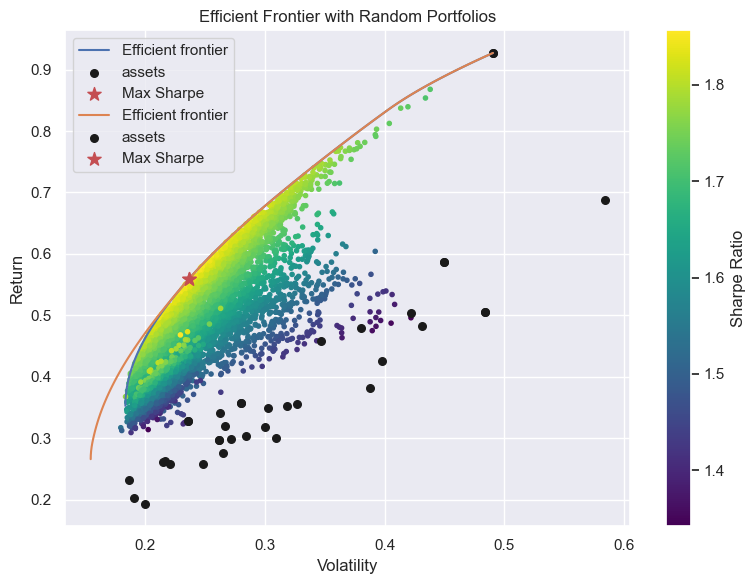

In [52]:
fig, ax = plt.subplots(figsize=(8,6))

# To plot with the 6 selected stocks:
plot_max_sharpe_and_ef(r = portfolio_r, covar = portfolio_covar, ax = ax, rfr = rfr)
plot_random_portfolios(r = portfolio_r, covar = portfolio_covar, n_samples = 5000)

# To plot with the 30 originally selected stocks:
plot_max_sharpe_and_ef(r = r, covar = covar, ax = ax, rfr = rfr) 
plot_random_portfolios(r = r, covar = covar, n_samples = 1000)


plt.title("Efficient Frontier with Random Portfolios")
plt.tight_layout()
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.legend()
plt.show()


The previous graph (although it has some duplicated points) allows us to make some interesting observations:

- The efficient frontiers are practically identical whether we use the 30 tickers or only the 6 selected ones, except in the minimum variance area. This is because within the 30 tickers, there are those with minimum variance (but low returns) that did not survive the selection. Otherwise, we see that there is no loss by eliminating the other tickers.
- The black points represent the individual tickers. We can see that, in general, they are much farther from the frontier than the rest of the random portfolios (except for the specific case of Nvidia, which is located at the upper right, on the frontier). This demonstrates the relevance of asset diversification to achieve a better balance between return and risk. Since in this case study, only S&P 500 stocks were selected, it is not a *truly* diversified portfolio, but it serves as an example.
- If the `n_assets` values in the instances of the `plot_random_portfolios` function are changed (or only the portfolios obtained with the 30 tickers are plotted), it can be observed that the portfolios that include only the selection of the 6 selected tickers are much closer to the frontier than those generated randomly from the 30 assets. Probably, it would be necessary to plot hundreds of thousands or millions of portfolios to begin populating the area near the frontier.

### Portfolio Performance
Now that the portfolio is assembled, we calculate all the metrics, this time using the PyPortfolioOpt library for simplicity.

In [53]:
expected_annual_return, annual_volatility, sharpe_ratio = ef.portfolio_performance(risk_free_rate = rfr)

print('Expected annual return: {}%'.format((expected_annual_return*100).round(2)))
print('Annual volatility: {}%'.format((annual_volatility*100).round(2)))
print('Sharpe ratio: {}'.format(sharpe_ratio.round(2)))

Expected annual return: 55.97%
Annual volatility: 23.65%
Sharpe ratio: 2.19


Now we want to analyze how the portfolio's value (AUM) evolves based on an initial investment. To do this, we define two new variables:  
i. The total amount invested (`inv0`).  
ii. The starting year of the investment (defined as the number of years ago) (`n`).  
We then create the array `initial_investment`, which represents the initial capital allocated to each stock.

In [54]:
inv0 = 1000 # USD
n = 10 # years
initial_investment = inv0*portfolio.squeeze() # Converts what would be a dataframe into a series, allowing element-wise division by initial prices.
portfolio_history = copy.deepcopy(portfolio_stock_prices.iloc[-n*ipy:])
initial_prices = portfolio_history.iloc[0]
number_of_stocks = initial_investment / initial_prices
portfolio_history = portfolio_history.mul(number_of_stocks)
portfolio_history["Optimized Portfolio"] = portfolio_history.sum(axis=1)

Next, we plot the portfolio value over time and compare it with the SPY ETF.

In [55]:
# Download historical data from SPY ETF
spy = yf.Ticker("SPY")
spy_prices = spy.history(period="{}y".format(n))['Close']  # Last n years
spy_prices = spy_prices * inv0 / spy_prices.iloc[0]

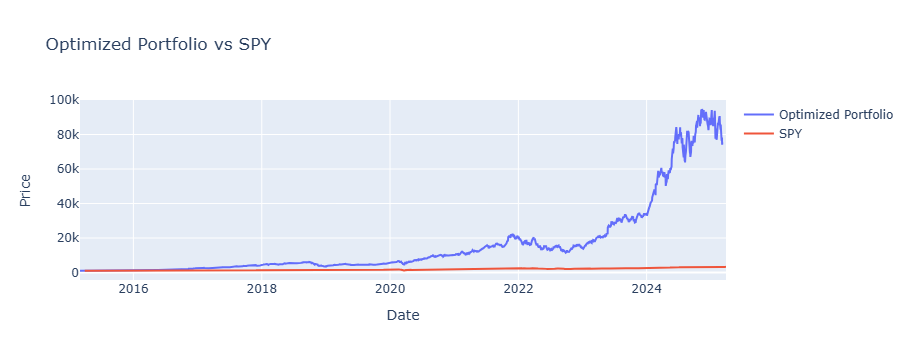

In [56]:
# Create the figure with the optimized portfolio series.
fig = go.Figure() 
# Add the optimized portfolio series.
fig.add_trace(go.Scatter(x=portfolio_history.index, y=portfolio_history['Optimized Portfolio'], 
    mode='lines', name='Optimized Portfolio'))
# Add the SPY series
fig.add_trace(go.Scatter(x=spy_prices.index, y=spy_prices, mode='lines', name='SPY'))
fig.update_layout(title='Optimized Portfolio vs SPY', xaxis_title='Date', yaxis_title='Price')
fig.show()

The value of the annual returns and the graph show an overwhelming superiority. However, was this foreseeable? Does the model allow us to obtain portfolios with a high probability of an optimal balance between return and risk? Or does it simply identify the best possible portfolio in hindsight?

## Evaluating the Method's Effectiveness in Portfolio Selection  

In this final section, we will conduct what could be considered a form of backtesting. We will construct portfolios on the efficient frontier using historical data from past years and analyze their performance in subsequent years.  

To determine the desired portfolio, we will split the data into a "training" set and a "test" set, assessing whether this portfolio construction method, applied to the training set, serves as a reliable estimator of risk-return performance for the test set.  

We will use the previously defined function with two parameters:  
- **N**: The number of years of historical data to be used for the training set.  
- **n**: The number of years of historical data to be used for the test set.  

For simplicity, and since we have already confirmed its equivalence, we will use the PyPortfolioOpt library to generate the portfolios.

#### Example Case

In [57]:
N = 10
n = 2
# Dataframes that include only the data within the relevant range for training and testing:
daily_returns_train = daily_returns.iloc[-N*ipy:-n*ipy]
covar_train = daily_returns_train.cov()*ipy

if n != 0:
    daily_returns_test = daily_returns.iloc[-n*ipy:]
    covar_test = daily_returns_test.cov()*ipy
else:
    print('Change the number of years used in the test set; **n** cannot be **0**.')
    
# Metrics for the individual tickers:
r_train, vol_train, s_train, covar = rsds(daily_returns, y1=N, y2=n, ipy=ipy, rfr=rfr) 
r_test, vol_test, s_test, covar = rsds(daily_returns, y1=n, y2=n-n, ipy=ipy, rfr=rfr) 

# Efficient frontier and its respective weights in the portfolio:
ef_train = EfficientFrontier(r_train, covar_train)
rfr = get_risk_free_rate()
ef_train.max_sharpe(risk_free_rate=rfr)
weights_train = ef_train.clean_weights()
weights_train_df = pd.DataFrame.from_dict(weights_train, orient = 'index')
weights_train_df.columns = ['Weights']
portfolio_train = copy.deepcopy(weights_train_df[weights_train_df['Weights'] != 0])

# Now we trim the portfolio again, keeping only the data of the included stocks.
portfolio_stock_prices_ = copy.deepcopy(stock_prices.loc[:, portfolio_train.index])
portfolio_daily_returns_ = copy.deepcopy(daily_returns.loc[:, portfolio_train.index])
portfolio_stock_prices_train = portfolio_stock_prices_.iloc[-N*ipy:-n*ipy]
portfolio_stock_prices_test = portfolio_stock_prices_.iloc[-n*ipy:]
portfolio_daily_returns_train = portfolio_daily_returns_.iloc[-N*ipy:-n*ipy]
portfolio_daily_returns_test = portfolio_daily_returns_.iloc[-n*ipy:]
portfolio_r_train = copy.deepcopy(r_train.loc[portfolio.index])
portfolio_covar_train = portfolio_daily_returns_train.cov()*ipy 
portfolio_covar_test = portfolio_daily_returns_test.cov()*ipy 

expected_annual_return, annual_volatility, sharpe_ratio = ef_train.portfolio_performance(risk_free_rate = rfr)
test_return = (np.sum(portfolio_stock_prices_test.iloc[-1])/np.sum(portfolio_stock_prices_test.iloc[0]) -1)**1/n
test_vol = vol(portfolio_covar_test, portfolio_train.squeeze())
test_sharpe = sharpe(test_return,test_vol,rfr)

print('Expected annual return: {}%'.format((expected_annual_return*100).round(2)))
print('Actual annual return: {}%'.format((test_return*100).round(2)))
print('Expected annual volatility: {}%'.format((annual_volatility*100).round(2)))
print('Actual annual volatility: {}%'.format((test_vol*100).round(2)))
print('Expected Sharpe ratio: {}'.format(sharpe_ratio.round(2)))
print('Actual Sharpe ratio: {}'.format(test_sharpe.round(2)))

Expected annual return: 52.08%
Actual annual return: 68.94%
Expected annual volatility: 25.46%
Actual annual volatility: 21.24%
Expected Sharpe ratio: 1.88
Actual Sharpe ratio: 3.04


The results in this case were better than expected, as the returns in the last 2 years were higher and more stable than those estimated from the previous 8 years. Now, we will generalize the code.

#### Generalization
Next, we will create a variety of different combinations of stocks from the price dataframe and determine the training and testing year ranges, respectively. Then, for each combination of stocks, we will obtain the efficient frontier portfolio for the training set. We will calculate the relevant metrics (returns, volatility, and Sharpe ratio) for the portfolio using the training data and then obtain the same metrics for the same portfolio evaluated on the testing set. Finally, we will plot the results showing how the metrics change between the training and testing sets for each portfolio on the efficient frontier.

Parameters to set:  
- `k`: number of tickers to select for the portfolio.
- `y_data`: how many years back we look at price data.
- `y_train`: how many years we consider to obtain the efficient frontier portfolio.
- `y_test`: how many years ahead we evaluate the portfolio.
- `iterations`: number of different portfolios to create for each combination of years.

To evaluate what happens with different year combinations, a `for` loop is used to sweep through various consecutive year subgroups based on the selected parameters. Since data subsets are repeated in each iteration, biases may be introduced in the results. It is possible to avoid this by setting the `iteration_range = 1` parameter, and thus an only year group is taken as training set.

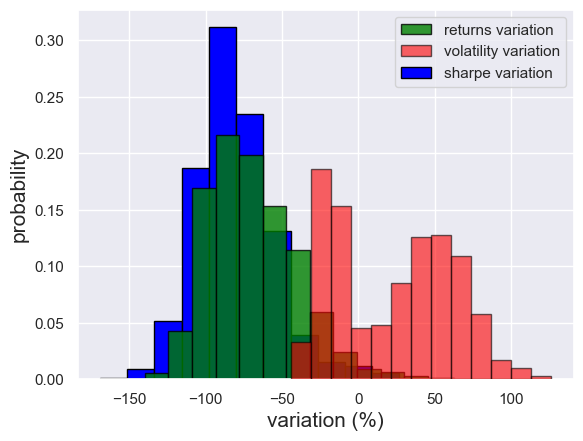

Variability of returns = (-69.5 +- 28.3)%
Variability of volatility = (22.4 +- 38.7)%
Variability of Sharpe = (-80.5 +- 26.3)%


In [59]:
np.random.seed(42)  # For reproducibility
prices = df["Close"].dropna(axis=1)

# Randomly select k tickers
k = 30 #  Number of tickers to select to build the portfolio.
iterations = 500 # Number of different portfolios to be created for each combination of years.
rfr = get_risk_free_rate()
rows = []

y_data = 10 # how many years back we look at price data.
y_train = 2 # how many years of data we consider to obtain the efficient frontier portfolio.
y_test = 2 # how many years ahead we evaluate the portfolio.
iteration_range = y_data+1-y_train-y_test

for j in np.arange(iteration_range): 
    N = y_data-j
    n = y_data-j-y_train
    for i in range(iterations):
        selected_tickers = np.random.choice(prices.columns, k, replace=False)
        selected_prices = prices[selected_tickers]
        daily_returns = selected_prices.pct_change(fill_method=None).iloc[1:len(selected_prices.index),:]

        # Training:
        selected_train_prices = prices[selected_tickers].iloc[-N*ipy:-n*ipy]
        selected_test_prices = prices[selected_tickers].iloc[-n*ipy:-(n-y_test)*ipy-1]
        daily_returns_train = selected_train_prices.pct_change(fill_method=None).iloc[1:len(selected_train_prices.index),:]
        historical_returns = expret.returns_from_prices(selected_train_prices)
        
        r_train, sd_train, s_train, covar_train = rsds(daily_returns, y1 = N, y2 = n, ipy = 252, rfr = rfr)
       
        ef_train = EfficientFrontier(r_train, covar_train)#, solver_options={"eps_abs": 1e-5, "eps_rel": 1e-5})
        ef_train.max_sharpe(risk_free_rate=rfr)
        weights_train = ef_train.clean_weights()
        weights_train_df = pd.DataFrame.from_dict(weights_train, orient = 'index')
        expected_returns, expected_volatility, expected_sharpe = ef_train.portfolio_performance(risk_free_rate = rfr) 

        # es_train = EfficientSemivariance(r_train, historical_returns)
        # es_train.efficient_return(0.20)
        # weights_train = es_train.clean_weights()
        # weights_train_df = pd.DataFrame.from_dict(weights_train, orient = 'index')
        # expected_returns, expected_volatility, expected_sharpe = es_train.portfolio_performance(risk_free_rate = rfr) 
        
        # Results of the portfolio in the testing set:
        test_stock_returns = (selected_test_prices.iloc[-1]/selected_test_prices.iloc[0]-1)
        test_anual_returns = (1+test_stock_returns)**(1/2)-1
        test_returns = test_anual_returns @ weights_train_df.squeeze() 
        r1, sd1, s1, covar1 = rsds(daily_returns, y1 = n, y2 = 0, ipy = 252, rfr = rfr)
        test_volatility = vol(covar1, weights_train_df.squeeze())
        test_sharpe = sharpe(test_returns, test_volatility, rfr)
        
        returns_variation = (test_returns/expected_returns -1)*100
        volatility_variation = (test_volatility/expected_volatility -1)*100
        sharpe_variation = (test_sharpe/expected_sharpe -1)*100
    
        # Adding the results to a list
        rows.append([expected_returns, expected_volatility, expected_sharpe,
                     test_returns, test_volatility, test_sharpe,
                    returns_variation, volatility_variation, sharpe_variation])

results = pd.DataFrame(rows, columns = ['expected_returns', 'expected_volatility', 'expected_sharpe', 
                                  'test_returns', 'test_volatility', 'test sharpe',
                                 'returns_variation','volatility_variation','sharpe_variation'])

# Add the variation results between training and test sets:
mean_var_returns = results['returns_variation'].mean()
mean_var_volatility = results['volatility_variation'].mean()
mean_var_sharpe = results['sharpe_variation'].mean()

std_var_returns = results['returns_variation'].std()
std_var_volatility = results['volatility_variation'].std()
std_var_sharpe = results['sharpe_variation'].std()

# Plot results as histograms:
h_rets, b_rets = np.histogram(results['returns_variation'], bins='sturges')
h_vols, b_vols = np.histogram(results['volatility_variation'], bins='sturges')
h_sharpe, b_sharpe = np.histogram(results['sharpe_variation'], bins='sturges')

freq_rets = h_rets / len(results['returns_variation'])
freq_vols = h_vols / len(results['volatility_variation'])
freq_sharpe = h_sharpe / len(results['sharpe_variation'])

bin_rets = b_rets[1] - b_rets[0]
bin_vols = b_vols[1] - b_vols[0]
bin_sharpe = b_sharpe[1] - b_sharpe[0]

plt.bar(b_rets[:-1], freq_rets, align='edge', width=bin_rets, alpha=0.8, label='returns variation', color='green', edgecolor='black' ,zorder=2)
plt.bar(b_vols[:-1], freq_vols, align='edge', width=bin_vols, alpha=0.6, label='volatility variation', color='red', edgecolor='black', zorder=3 )
plt.bar(b_sharpe[:-1], freq_sharpe, align='edge', width=bin_sharpe, alpha=1, label='sharpe variation', color='blue', edgecolor='black',zorder=1 )
plt.legend()
plt.grid(True)
plt.xlabel('variation (%)', fontsize=15)
plt.ylabel('probability', fontsize=15)
plt.show()

print(f"Variability of returns = ({round(mean_var_returns,1)} +- {round(std_var_returns,1)})%")
print(f"Variability of volatility = ({round(mean_var_volatility,1)} +- {round(std_var_volatility,1)})%")
print(f"Variability of Sharpe = ({round(mean_var_sharpe,1)} +- {round(std_var_sharpe,1)})%")

The results shown are an example of the variability in the metrics when evaluating the portfolio on the test set. By varying the training and testing year parameters and sweeping through different historical periods, the values change. However, in all combinations of "training" and "test" years and the number of assets in the evaluated portfolio, the histograms show similar behavior:
- The returns obtained in the test set decrease significantly compared to the training set (generally, the average is more than 50% lower).
- The volatility fluctuates around zero, sometimes exceeding and sometimes falling below the training set.
- The Sharpe ratio is also noticeably lower in the test set, reaching an average of 75% lower.
And in all three cases, the variability of the results across portfolios is very high (related to the standard deviation of the metric variation).

## Conclusions

The results obtained show that choosing a portfolio simply because it is on the efficient frontier for a given time range does not guarantee its performance and volatility in the following years. However, this study was limited by several factors:
- It was restricted to a small group of assets (approximately 500), all from the same ETF (S&P 500).
- The assets generally have a high correlation, as they are stocks of large-cap companies in the U.S. market.
- A limited time range was studied (10 years).

To create an investment portfolio that reduces risk, it is necessary to diversify the types of instruments and markets. Therefore, in the future, the goal will be to gather data from a larger and more diversified group of tickers, including ETFs, bonds, etc., and again identify portfolios on the efficient frontier. Also, different optimization criteria may be tested, such as efficient semi-variance, efficient CVaR, among others.

## Other Resources

The list below contains other articles and repositories with python scripts that find the portfolio on the efficient frontier.

- https://www.kaggle.com/code/trangthvu/efficient-frontier-optimization 
- https://github.com/damianboh/portfolio_optimization/blob/main/Max%20Sharpe%20Ratio%20Portfolio%20Optimization%20for%20Stocks%20Using%20PyPortfolioOpt.ipynb
- https://github.com/zhuodannychen/Portfolio-Optimization  
- https://towardsdatascience.com/python-markowitz-optimization-b5e1623060f5/